In [1]:
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

In [2]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split

In [3]:
import time
import segmentation_models_pytorch as smp

## Dataset

In [19]:
DATALOADER_NUM_WORKERS=8


image_directory = "/gpfs/space/home/obedkobi/neural_net/Mapillary_Dataset/training/"
label_directory = "/gpfs/space/home/obedkobi/neural_net/Mapillary_Dataset/training/v2.0/labels/"

# Walk through the image directory to gather all image files 
image_files = []
for root, dirs, files in os.walk(image_directory):
    for file in files:
        if file.lower().endswith('.jpg'):
            full_path = os.path.join(root, file)
            rel_filename = '/'.join(full_path.split('/')[-2:])
            image_files.append(rel_filename)

In [20]:
# Sort the image files
image_files = sorted(image_files)

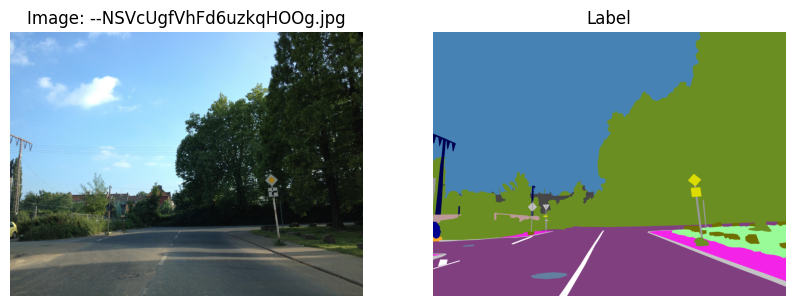

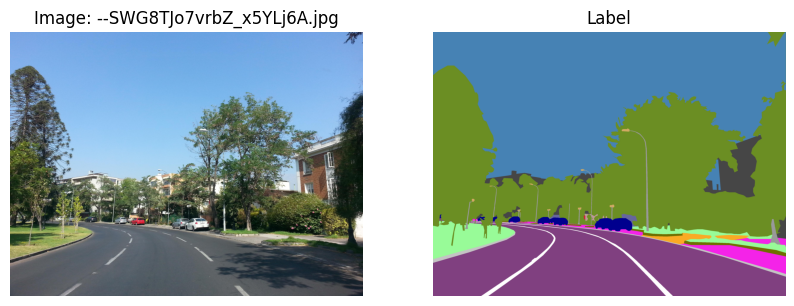

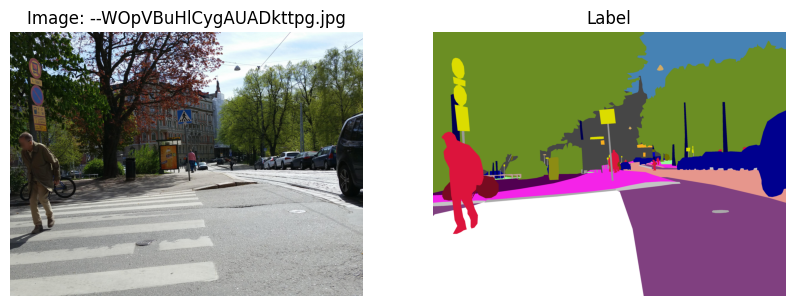

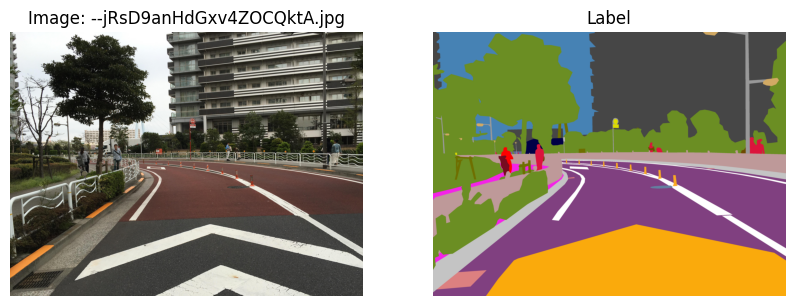

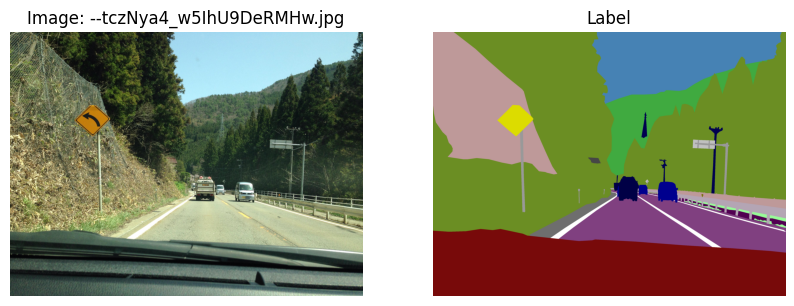

In [23]:
# print(len(image_files))
# print(image_files[1])

for i, image_file in enumerate(image_files[:5]):
    if image_file.endswith(".jpg"):
        # Read the image
        image = Image.open(os.path.join(image_directory, image_file))
        
        # Get corresponding label filename
        label_file = os.path.join(label_directory, image_file.split("/")[-1])
        # print(label_file)
        # print(os.path.exists(label_file.replace('.jpg', '.png')))
        # print(label_file.replace('.jpg', '_seg.png'))
        # print(os.path.exists('/gpfs/space/home/obedkobi/neural_net/cityscapes/leftImg8bit/train/aachen/aachen_000000_000019_leftImg8bit.png'))
        if os.path.exists(label_file.replace('.jpg', '.png')):
        # Read the label
            # print("hello")
            label = Image.open(label_file.replace('.jpg', '.png'))
            # Plot the images and labels side by side
            fig, axes = plt.subplots(1, 2, figsize=(10, 5))
            axes[0].imshow(image)
            axes[0].set_title("Image: " + image_file.split("/")[-1])  # Add image title
            axes[0].axis('off')
            axes[1].imshow(label)
            axes[1].set_title("Label")
            axes[1].axis('off')
            plt.show()

In [24]:
print(image_files[0])

images/--NSVcUgfVhFd6uzkqHOOg.jpg


In [102]:
VISTAS_BASE_PATH = "/gpfs/space/home/obedkobi/neural_net/Mapillary_Dataset"
VISTAS_NUM_CLASSES = 124

class VistasDataset(Dataset):
    def __init__(self, 
                 dataset_name,
                 image_dir, 
                 label_dir, 
                 image_files, 
                 num_classes, 
                 preprocessing_fn=None, 
                 downscale_to_height=None, 
                 crop_dims=None
        ):
        self.dataset_name = dataset_name
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.image_files = image_files
        self.num_classes = num_classes
        self.preprocessing_fn = preprocessing_fn
        self.resize = transforms.Resize(downscale_to_height) if downscale_to_height is not None else None
        self.crop_dims = crop_dims
        
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        image_file = self.image_files[idx]
        image_path = os.path.join(self.image_dir, image_file.split("/")[-1])
        # print(image_path)
        label_path = os.path.join(self.label_dir, image_file.split("/")[-1].replace(".jpg", ".png"))
        # print(label_path)

        image = transforms.functional.to_tensor(Image.open(image_path)).type(torch.float32)
        label = torch.Tensor(np.array(Image.open(label_path))).type(torch.long).unsqueeze(0)
        
        # Apply transformations
        if self.resize:
            image = self.resize(image)
            label = self.resize(label)
        if self.crop_dims:
            params = transforms.RandomCrop.get_params(image, self.crop_dims)
            image = transforms.functional.crop(image, *params)
            label = transforms.functional.crop(label, *params)

        # Convert label from (W, H) to (C, W, H) - each class would have its own mask
        mask = F.one_hot(label, self.num_classes).squeeze(0).permute(2, 0, 1)

        # Applying standartization using the statistics of the pretrained model
        if self.preprocessing_fn:
            image = self.preprocessing_fn(image.permute(1,2,0)).permute(2,0,1)

        return (    
            image.type(torch.float32),
            mask.type(torch.float32),
        )

In [103]:
X_train, X_test = train_test_split(image_files, test_size=0.1, random_state=42)

len(X_train), len(X_test)

(16200, 1800)

In [104]:
import random

def get_subset(arr, size=0.5):
    r = random.Random(42)
    r.shuffle(arr)
    return arr[:int(len(arr) * size)]

### Model

In [105]:
ENCODER = 'resnet101'
ENCODER_WEIGHTS = 'imagenet'
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [106]:
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=124,
)

In [107]:
train_dataset = VistasDataset(
    dataset_name = "Vistas",
    image_dir = VISTAS_BASE_PATH + "/training/images/", 
    label_dir = VISTAS_BASE_PATH + "/training/v2.0/labels/",
    image_files=get_subset(X_train, 0.4),
    num_classes=VISTAS_NUM_CLASSES,
    preprocessing_fn=preprocessing_fn,
    downscale_to_height=512,
    crop_dims=(512, 512)
)

In [108]:
valid_dataset = VistasDataset(
    dataset_name = "Vistas",
    image_dir = VISTAS_BASE_PATH + "/validation/images/",
    label_dir = VISTAS_BASE_PATH + "/validation/v2.0/labels/",
    image_files = get_subset(sorted(os.listdir(VISTAS_BASE_PATH + "/validation/images/")), 0.4),
    num_classes=VISTAS_NUM_CLASSES,
    preprocessing_fn=preprocessing_fn,
    downscale_to_height=512,
    crop_dims=(512, 512)
)

In [109]:
def collate_fn(batch):
    batch_by_dataset = defaultdict(lambda: defaultdict(list))
    for item in batch:
        batch_by_dataset[item["dataset_name"]]["x"].append(
            item["image"]
        )
        batch_by_dataset[item["dataset_name"]]["y"].append(
            item["mask"]
        )
    for dataset_name, mini_batch in batch_by_dataset.items():
        batch_by_dataset[dataset_name]["x"] = torch.stack(mini_batch["x"])
        batch_by_dataset[dataset_name]["y"] = torch.stack(mini_batch["y"])
    return dict(batch_by_dataset)

In [110]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=8)
valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, num_workers=8)

In [111]:
from segmentation_models_pytorch import utils

In [112]:
loss = utils.losses.DiceLoss(activation='softmax2d')
metrics = [
    utils.metrics.IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

In [113]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [114]:
max_score = 0
for i in range(0, 5):
    
    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)
    
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, './best_model_vistas.pth')
        print('Model saved!')

    if i == 15:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')
        


Epoch: 0
train: 100%|█| 810/810 [22:09<00:00,  1.64s/it, dice_loss - 0.5527, iou_score - 
valid: 100%|█| 100/100 [02:49<00:00,  1.70s/it, dice_loss - 0.4735, iou_score - 
Model saved!

Epoch: 1
train: 100%|█| 810/810 [22:14<00:00,  1.65s/it, dice_loss - 0.2969, iou_score - 
valid: 100%|█| 100/100 [02:50<00:00,  1.70s/it, dice_loss - 0.3589, iou_score - 
Model saved!

Epoch: 2
train: 100%|█| 810/810 [22:12<00:00,  1.64s/it, dice_loss - 0.2797, iou_score - 
valid: 100%|█| 100/100 [02:51<00:00,  1.71s/it, dice_loss - 0.3235, iou_score - 
Model saved!

Epoch: 3
train: 100%|█| 810/810 [22:14<00:00,  1.65s/it, dice_loss - 0.2541, iou_score - 
valid: 100%|█| 100/100 [02:51<00:00,  1.72s/it, dice_loss - 0.408, iou_score - 0

Epoch: 4
train: 100%|█| 810/810 [22:36<00:00,  1.67s/it, dice_loss - 0.2503, iou_score - 
valid: 100%|█| 100/100 [02:54<00:00,  1.74s/it, dice_loss - 0.433, iou_score - 0


## Testing

In [115]:
best_model = torch.load('./best_model_vistas.pth')

In [124]:
test_dataset = VistasDataset(
    dataset_name = "Vistas",
    image_dir = VISTAS_BASE_PATH + "/training/images/", 
    label_dir = VISTAS_BASE_PATH + "/training/v2.0/labels/",
    image_files=get_subset(X_test, 0.4),
    num_classes=VISTAS_NUM_CLASSES,
    preprocessing_fn=preprocessing_fn,
    downscale_to_height=512,
    crop_dims=(512, 512)
)

test_dataloader = DataLoader(test_dataset, batch_size=8, num_workers=2)

In [125]:
loss = utils.losses.DiceLoss(activation='softmax2d')
metrics = [
    utils.metrics.IoU(threshold=0.5),
]

test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

valid: 100%|█| 90/90 [05:37<00:00,  3.75s/it, dice_loss - 0.3116, iou_score - 0.


In [126]:
logs

{'dice_loss': 0.31162660055690344, 'iou_score': 0.5279416186941993}

### Prediction Evaluation

In [136]:
test_dataset_vis = VistasDataset(
    dataset_name = "Vistas",
    image_dir = VISTAS_BASE_PATH + "/training/images/", 
    label_dir = VISTAS_BASE_PATH + "/training/v2.0/labels/",
    image_files=get_subset(X_test),
    num_classes=VISTAS_NUM_CLASSES,
    downscale_to_height=512,
    crop_dims=(512, 512)
)

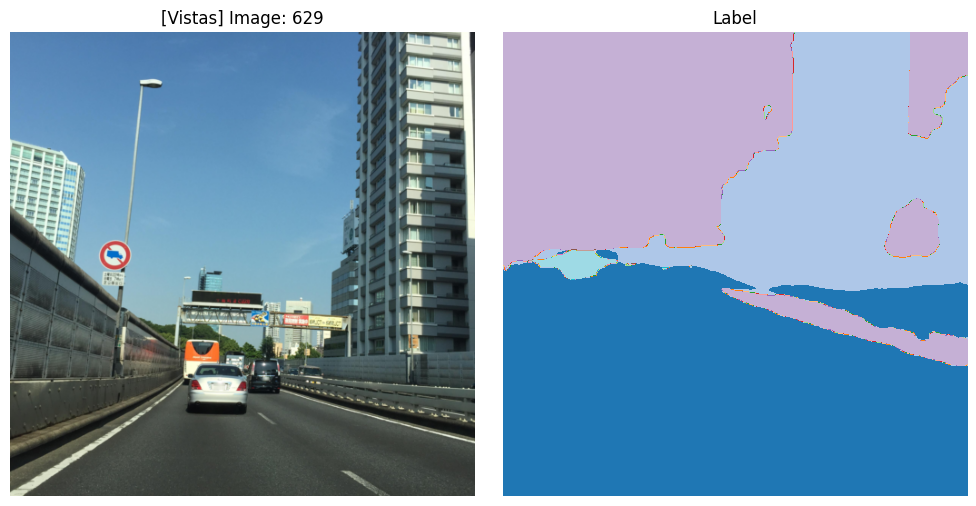

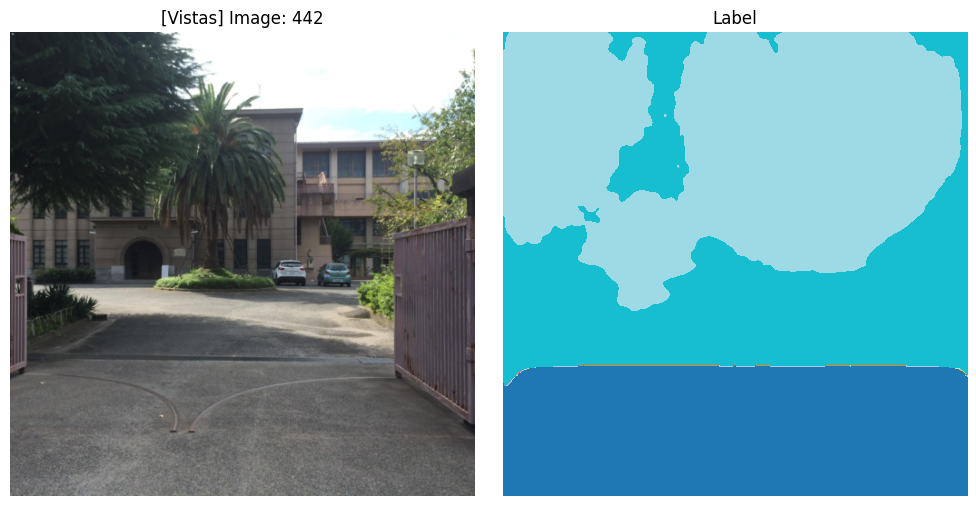

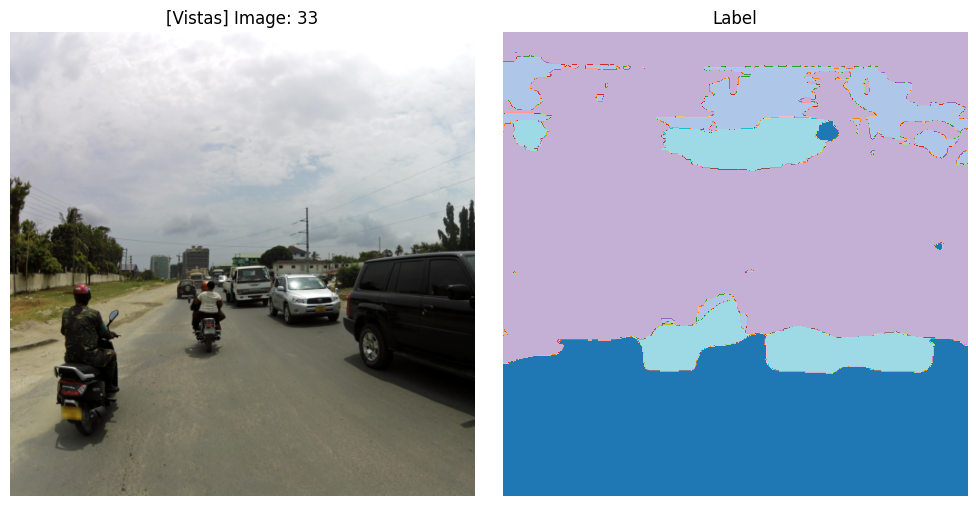

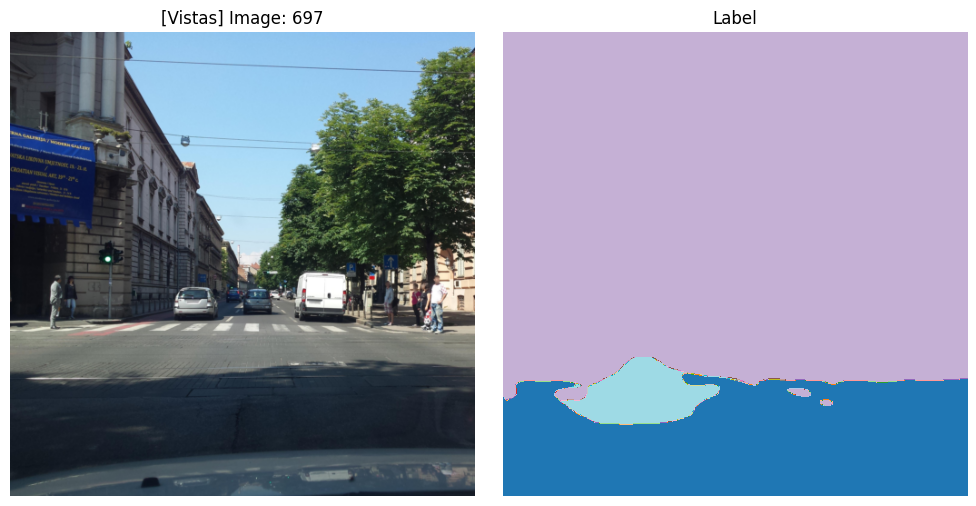

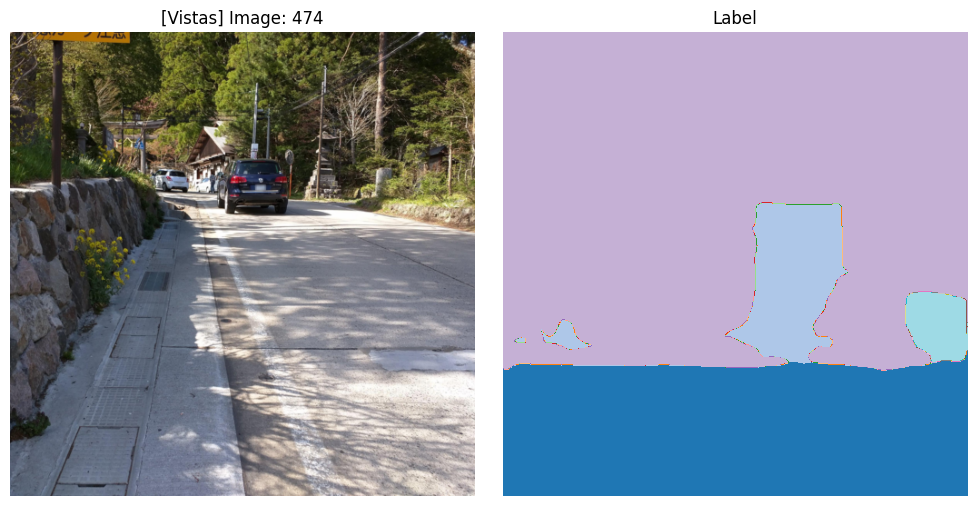

...

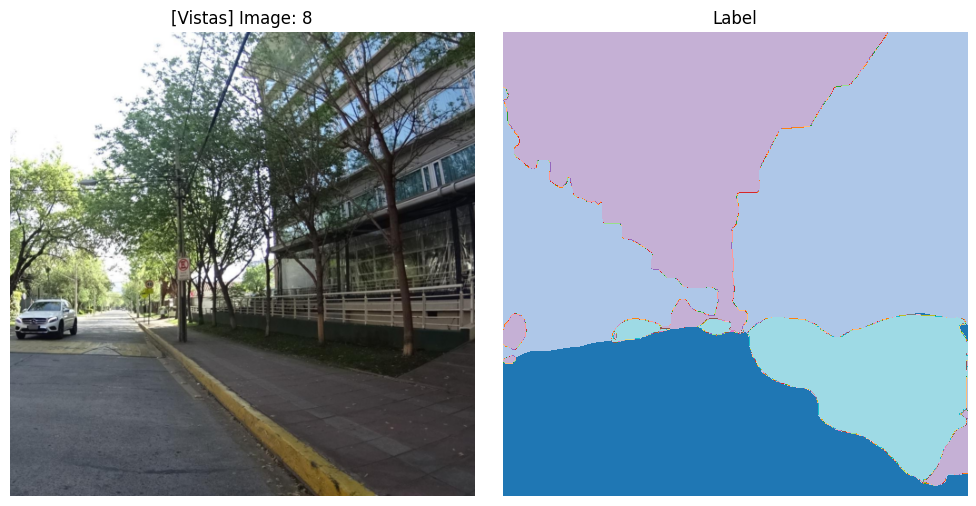

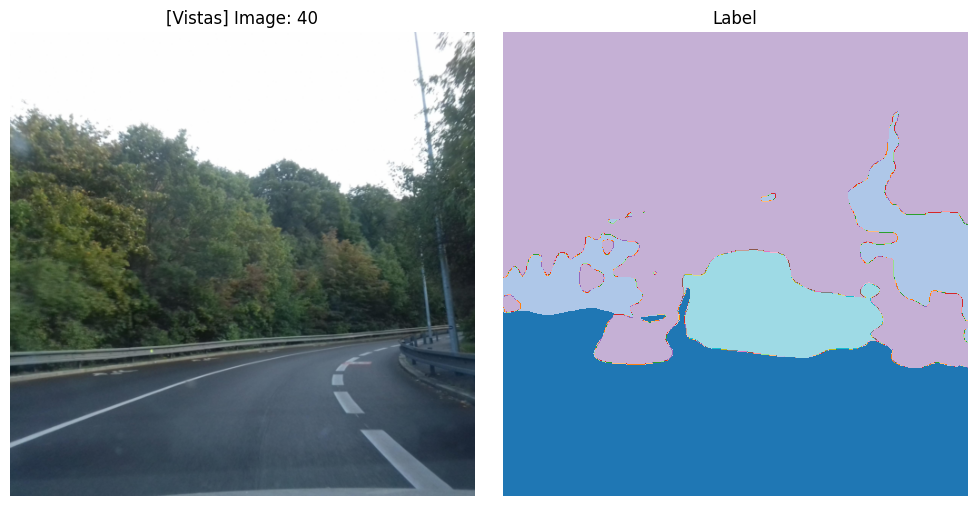

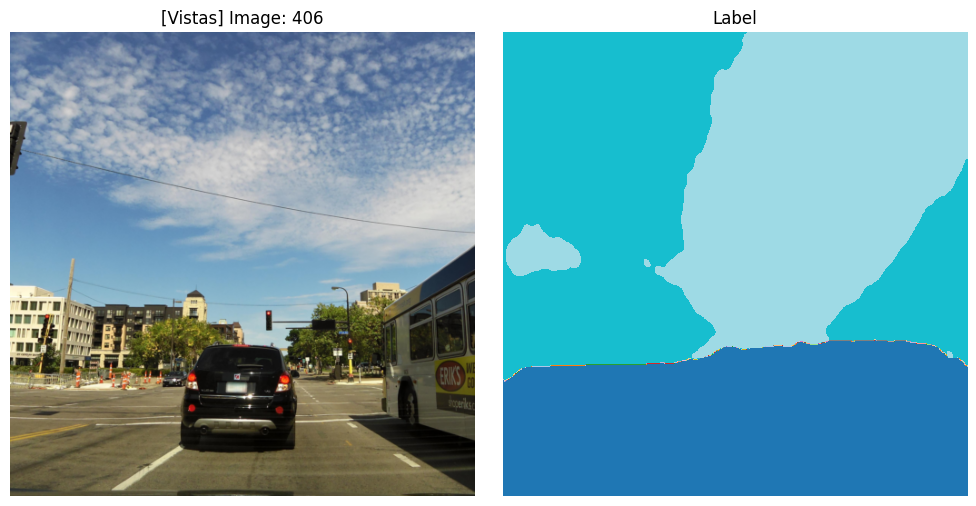

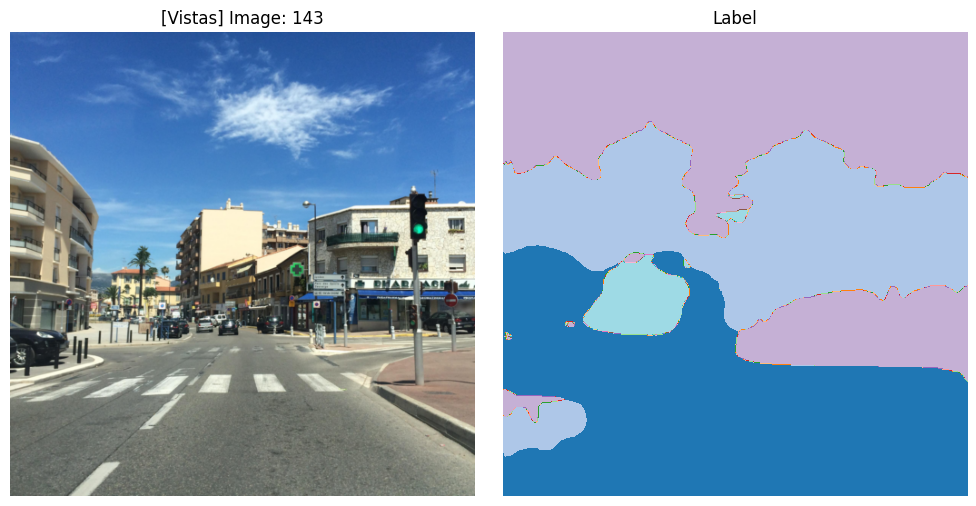

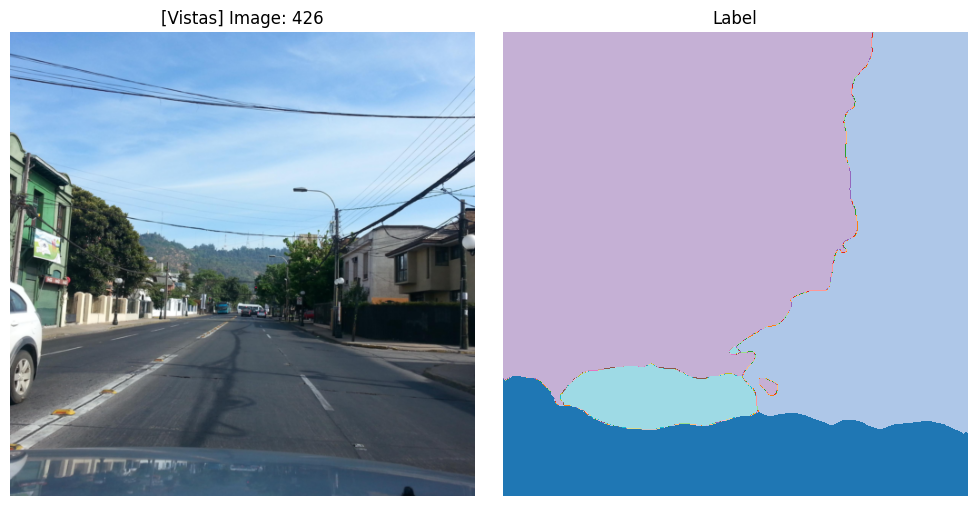

In [137]:
for i in range(20):
    n = np.random.choice(len(test_dataset))
    
    image_vis = test_dataset_vis[n][0]
    image, gt_mask = test_dataset[n]
    
    gt_mask = gt_mask.squeeze()
    
    x_tensor = image.to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor).cpu().squeeze(0).argmax(dim=0).type(torch.long).numpy().round()

    # remove
    # image_resized = Image.fromarray((image_vis.permute(1,2,0).cpu().numpy() * 255).round().astype(np.uint8)).resize((960, 544))
    # mask_resized = Image.fromarray(pr_mask.astype(np.uint8)).resize((960, 544))

    image_resized = Image.fromarray((image_vis.permute(1,2,0).cpu().numpy() * 255).round().astype(np.uint8))
    mask_resized = Image.fromarray(pr_mask.astype(np.uint8))

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(image_resized)
    axes[0].set_title(f"[Vistas] Image: {n}")
    axes[0].axis('off')
    axes[1].imshow(mask_resized, cmap='tab20')
    axes[1].set_title("Label")
    axes[1].axis('off')
    plt.tight_layout()

    # Save the plot to a file
    output_file = os.path.join("", f'output_vistas_{n}.png')
    plt.savefig(output_file)
    
    plt.show()
    plt.close(fig)